In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import gwaslab as gl

In [3]:
# The most significant SNP on each chromosome 
def sig_snps(dataset):
    significant_snps = dataset[dataset['Pval'] < 5e-6]
    min_p_snps = significant_snps.groupby('Chr')['Pval'].min().reset_index()
    result = pd.merge(min_p_snps, significant_snps, on=['Chr', 'Pval'], how='left')
    for index, row in result.iterrows():
        chromosome = row['Chr']
        snp_name = row['Name']
        print(f"'Chr{chromosome}:{snp_name}',")

# Create Manhattan plot
def manhattan(dataset, title, cutfactor, annoset, annotext, cut=10, save=True):    
    dataset['SE'] = dataset['Info'].str.extract(r';SE=(.*?);').astype(float)
    dataset['N'] = dataset['Num_Cases'] + dataset['Num_Controls']
    mysumstats = gl.Sumstats(dataset,
                 snpid="Name",
                 chrom="Chr",
                 pos="Pos",
                 ea="Alt",
                 nea="Ref",
                 neaf="AAF",
                 beta="Effect",
                 se="SE",
                 p="Pval",
                 n="N",
                 build="19")
    
    mysumstats.plot_mqq(mode="m",
                       skip=1, 
                       sig_level=5e-8,
                       cut=cut, 
                       cut_line_color='#FFFFFF00',   
                       cutfactor=cutfactor,          
                       anno=True,
                       anno_set= annoset, 
                       anno_alias=annotext,
                       stratified=True,  
                       marker_size=(5,10),
                       suggestive_sig_line=True,
                       colors=["#527865","#94d4bc"],
                       mtitle=title,
                       title_pad=1.2,
                       figargs={"figsize":(15,5),"dpi":300},
                       fontsize = 12,
                       anno_fontsize = 10,
                       title_fontsize = 20)
    if save:
        plt.savefig(f'{title}_manhattan.png', dpi=500, bbox_inches='tight', facecolor='white')
        print(f"Figure saved as: {title}_manhattan.png")
    
    return None

## A4

In [5]:
A4 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/cluster2/concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A4)

'Chr1:rs11588934',
'Chr4:rs6817628',
'Chr6:rs60628212',
'Chr8:rs80344830',
'Chr10:rs148892893',
'Chr11:rs12794482',
'Chr19:rs55977254',
'Chr20:rs117634158',


2025/10/09 11:36:24 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/09 11:36:24 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/09 11:36:24 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/09 11:36:24 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/09 11:36:43  -Reading columns          : AAF,Chr,Name,Pval,Pos,Effect,Ref,SE,Alt,N
2025/10/09 11:36:43  -Renaming columns to      : EAF,CHR,SNPID,P,POS,BETA,NEA,SE,EA,N
2025/10/09 11:36:43  -Current Dataframe shape : 46996239  x  10
2025/10/09 11:36:47  -Initiating a status column: STATUS ...
2025/10/09 11:36:47  -Genomic coordinates are based on GRCh37/hg19...
2025/10/09 11:36:52  -NEAF is specified...
2025/10/09 11:36:52  -Checking if 0<= NEAF <=1 ...
2025/10/09 11:36:55  -Converted NEAF to EAF.
2025/10/09 11:36:55  -Removed 0 variants with bad NEAF.
2025/10/09 11:36:55 Start to reorder the columns...v3.6.0
2025/10/09 11

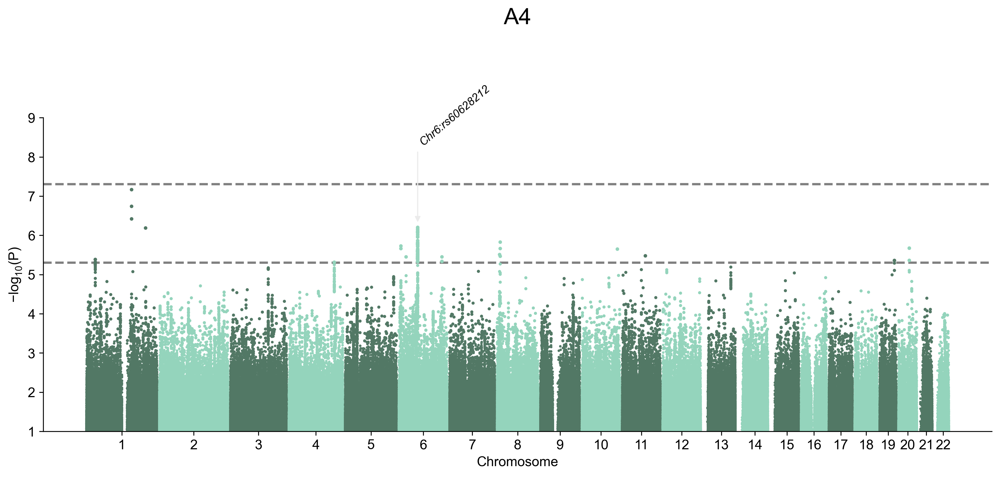

In [7]:
manhattan(A4,'A4',None,['rs60628212'],{'rs60628212':'Chr6:rs60628212'},cut=1,save=True)

## A6

In [ ]:
A6 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/cluster2/concat.cl6.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [63]:
sig_snps(clust6)

'Chr1:rs583731',
'Chr2:rs71415578',
'Chr4:rs549158690',
'Chr5:rs146156433',
'Chr6:rs9469008',
'Chr8:rs4841431',
'Chr9:rs10983706',
'Chr11:rs77890156',
'Chr12:rs7959278',
'Chr13:rs79815694',
'Chr16:rs4451931',
'Chr17:rs1419060804',
'Chr18:rs182542408',
'Chr19:rs77063268',


2025/09/27 23:44:42 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 23:44:42 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 23:44:42 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 23:44:42 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 23:45:01  -Reading columns          : Chr,Alt,Pval,Effect,SE,N,Name,Pos,Ref,AAF
2025/09/27 23:45:01  -Renaming columns to      : CHR,EA,P,BETA,SE,N,SNPID,POS,NEA,EAF
2025/09/27 23:45:01  -Current Dataframe shape : 46430057  x  10
2025/09/27 23:45:03  -Initiating a status column: STATUS ...
2025/09/27 23:45:03  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 23:45:08  -NEAF is specified...
2025/09/27 23:45:08  -Checking if 0<= NEAF <=1 ...
2025/09/27 23:45:11  -Converted NEAF to EAF.
2025/09/27 23:45:11  -Removed 0 variants with bad NEAF.
2025/09/27 23:45:11 Start to reorder the columns...v3.6.3
2025/09/27 23

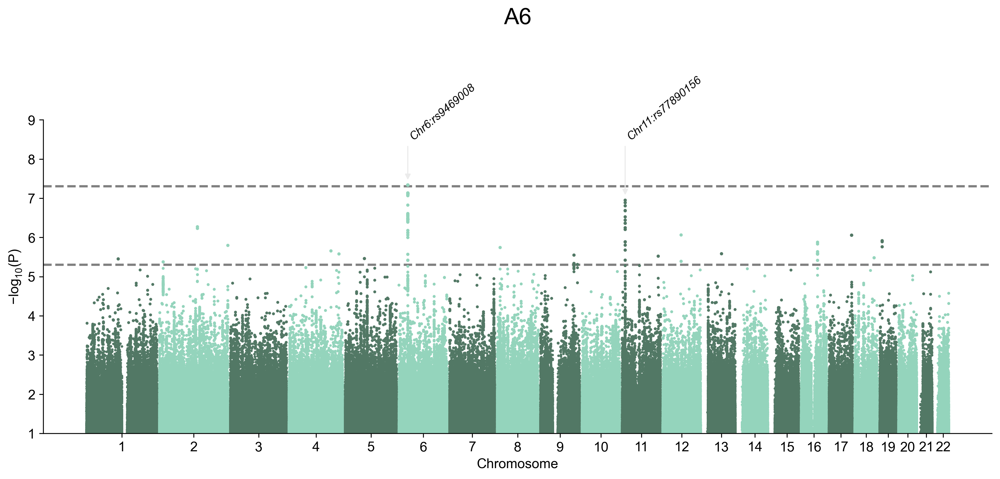

In [8]:
manhattan(A6,'A6',None,['rs9469008','rs77890156'],{'rs9469008':'Chr6:rs9469008','rs77890156':'Chr11:rs77890156'},
          cut=1,save=True)

## A9 

In [5]:
A9 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/comp/concat.cl1.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A9)

'Chr1:rs6426007',
'Chr2:rs565985555',
'Chr3:rs191561699',
'Chr5:rs116097828',
'Chr6:rs41269597',
'Chr7:rs73235843',
'Chr8:rs2976386',
'Chr10:rs10781559',
'Chr11:rs71484134',
'Chr12:rs61914868',
'Chr13:rs189552875',
'Chr17:rs73294315',
'Chr18:rs139458020',
'Chr19:rs9749607',


2025/09/27 19:27:44 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 19:27:44 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 19:27:44 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 19:27:44 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 19:27:58  -Reading columns          : N,Pval,Effect,Name,SE,Pos,AAF,Chr,Ref,Alt
2025/09/27 19:27:58  -Renaming columns to      : N,P,BETA,SNPID,SE,POS,EAF,CHR,NEA,EA
2025/09/27 19:27:58  -Current Dataframe shape : 44590173  x  10
2025/09/27 19:28:00  -Initiating a status column: STATUS ...
2025/09/27 19:28:00  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 19:28:05  -NEAF is specified...
2025/09/27 19:28:05  -Checking if 0<= NEAF <=1 ...
2025/09/27 19:28:07  -Converted NEAF to EAF.
2025/09/27 19:28:07  -Removed 0 variants with bad NEAF.
2025/09/27 19:28:08 Start to reorder the columns...v3.6.3
2025/09/27 19

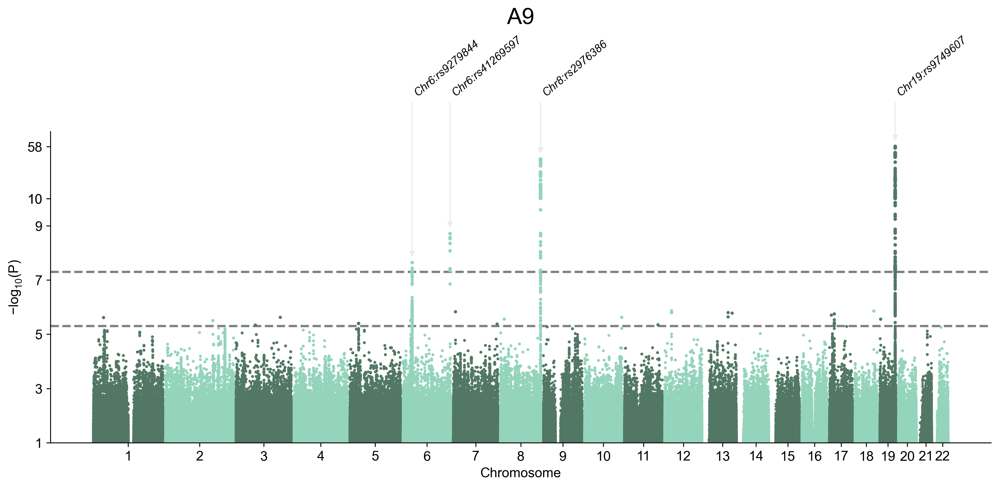

In [36]:
manhattan(A9,'A9',25,['rs41269597','rs9279844','rs2976386','rs9749607'],
          {'rs41269597':'Chr6:rs41269597','rs9279844':'Chr6:rs9279844','rs2976386':'Chr8:rs2976386','rs9749607':'Chr19:rs9749607'},save=True)

## A10

In [ ]:
A10 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/comp/concat.cl2.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [16]:
sig_snps(A10)

'Chr1:rs1090244',
'Chr2:rs567275305',
'Chr3:rs114513574',
'Chr4:rs147646095',
'Chr7:rs4720213',
'Chr8:rs2976398',
'Chr9:rs117070164',
'Chr10:rs139856753',
'Chr13:rs142564463',
'Chr14:rs11629409',
'Chr19:rs3826877',


2025/09/27 20:15:46 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 20:15:46 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 20:15:46 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 20:15:46 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 20:16:03  -Reading columns          : AAF,Alt,Pval,Name,SE,Ref,N,Effect,Chr,Pos
2025/09/27 20:16:03  -Renaming columns to      : EAF,EA,P,SNPID,SE,NEA,N,BETA,CHR,POS
2025/09/27 20:16:03  -Current Dataframe shape : 44673893  x  10
2025/09/27 20:16:07  -Initiating a status column: STATUS ...
2025/09/27 20:16:07  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 20:16:11  -NEAF is specified...
2025/09/27 20:16:11  -Checking if 0<= NEAF <=1 ...
2025/09/27 20:16:14  -Converted NEAF to EAF.
2025/09/27 20:16:14  -Removed 0 variants with bad NEAF.
2025/09/27 20:16:15 Start to reorder the columns...v3.6.3
2025/09/27 20

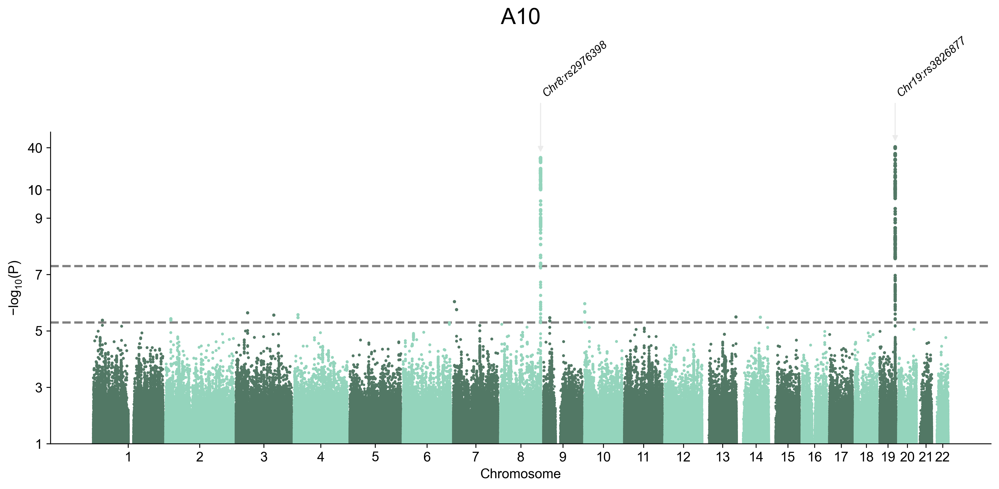

In [9]:
# comp2
manhattan(A10,'A10',20,['rs2976398','rs3826877'],{'rs2976398':'Chr8:rs2976398','rs3826877':'Chr19:rs3826877'},save=True)

## A11

In [ ]:
A11 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/comp/concat.cl3.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A11)

'Chr6:rs2857129',
'Chr7:rs550828696',
'Chr8:rs2976398',
'Chr9:rs577340587',
'Chr14:rs74394317',
'Chr19:rs76248118',


2025/09/27 19:31:05 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 19:31:05 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 19:31:05 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 19:31:05 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 19:31:25  -Reading columns          : N,Pval,Effect,Name,SE,Pos,AAF,Chr,Ref,Alt
2025/09/27 19:31:25  -Renaming columns to      : N,P,BETA,SNPID,SE,POS,EAF,CHR,NEA,EA
2025/09/27 19:31:25  -Current Dataframe shape : 44630167  x  10
2025/09/27 19:31:27  -Initiating a status column: STATUS ...
2025/09/27 19:31:27  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 19:31:32  -NEAF is specified...
2025/09/27 19:31:32  -Checking if 0<= NEAF <=1 ...
2025/09/27 19:31:35  -Converted NEAF to EAF.
2025/09/27 19:31:35  -Removed 0 variants with bad NEAF.
2025/09/27 19:31:35 Start to reorder the columns...v3.6.3
2025/09/27 19

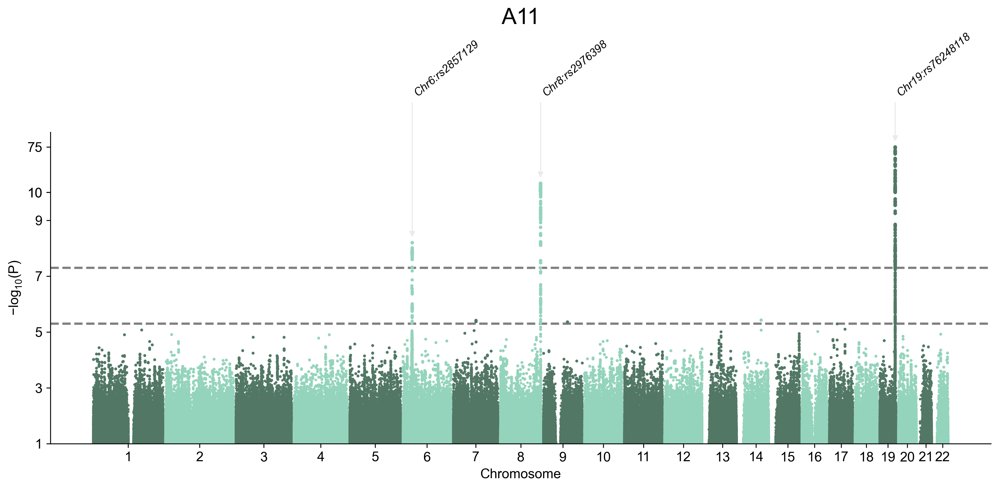

In [38]:
manhattan(A11,'A11',40,['rs2857129','rs2976398','rs76248118'],
          {'rs2857129':'Chr6:rs2857129','rs2976398':'Chr8:rs2976398','rs76248118':'Chr19:rs76248118'},save=True)

## A12

In [ ]:
A12 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/comp/concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A12)

'Chr1:rs137854925',
'Chr3:rs62273811',
'Chr8:rs5895729',
'Chr15:rs190299280',
'Chr19:rs9749607',
'Chr21:rs77033838',
'Chr22:rs5751776',


2025/09/27 21:34:47 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 21:34:47 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 21:34:47 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 21:34:47 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 21:35:05  -Reading columns          : N,Name,AAF,Pos,SE,Alt,Chr,Pval,Effect,Ref
2025/09/27 21:35:05  -Renaming columns to      : N,SNPID,EAF,POS,SE,EA,CHR,P,BETA,NEA
2025/09/27 21:35:05  -Current Dataframe shape : 44672241  x  10
2025/09/27 21:35:07  -Initiating a status column: STATUS ...
2025/09/27 21:35:07  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 21:35:11  -NEAF is specified...
2025/09/27 21:35:11  -Checking if 0<= NEAF <=1 ...
2025/09/27 21:35:13  -Converted NEAF to EAF.
2025/09/27 21:35:13  -Removed 0 variants with bad NEAF.
2025/09/27 21:35:13 Start to reorder the columns...v3.6.3
2025/09/27 21

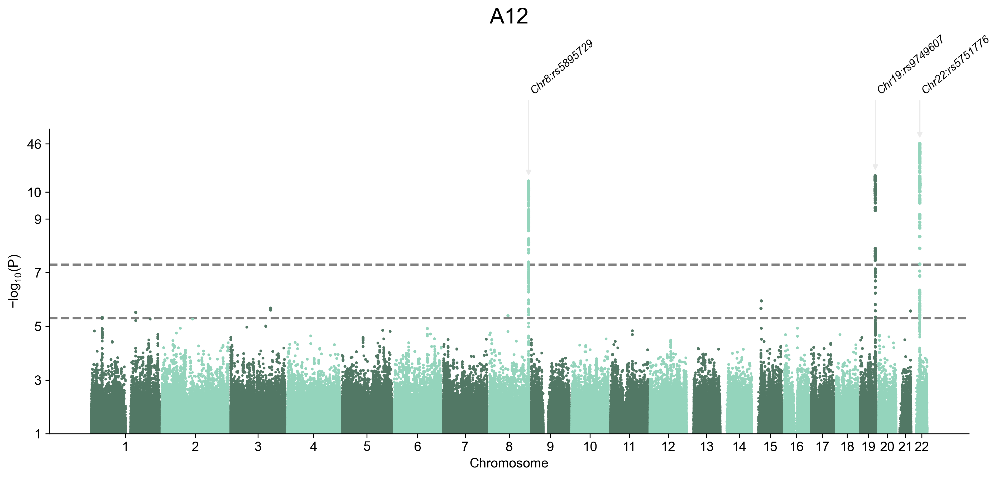

In [9]:
figure = manhattan(A12,'A12',20,['rs5895729','rs9749607','rs5751776'],
                   {'rs5895729':'Chr8:rs5895729','rs9749607':'Chr19:rs9749607','rs5751776':'Chr22:rs5751776'},save=True)

## A25

In [5]:
A25 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/3k/concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [8]:
sig_snps(A25)

'Chr5:rs143794810',
'Chr6:rs117511118',
'Chr8:rs115984024',
'Chr10:rs61861335',
'Chr22:rs1006771',


2025/09/27 23:37:37 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 23:37:37 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 23:37:37 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 23:37:37 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 23:37:54  -Reading columns          : Chr,Alt,Pval,Effect,SE,N,Name,Pos,Ref,AAF
2025/09/27 23:37:54  -Renaming columns to      : CHR,EA,P,BETA,SE,N,SNPID,POS,NEA,EAF
2025/09/27 23:37:54  -Current Dataframe shape : 44847026  x  10
2025/09/27 23:37:56  -Initiating a status column: STATUS ...
2025/09/27 23:37:56  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 23:38:00  -NEAF is specified...
2025/09/27 23:38:00  -Checking if 0<= NEAF <=1 ...
2025/09/27 23:38:02  -Converted NEAF to EAF.
2025/09/27 23:38:02  -Removed 0 variants with bad NEAF.
2025/09/27 23:38:02 Start to reorder the columns...v3.6.3
2025/09/27 23

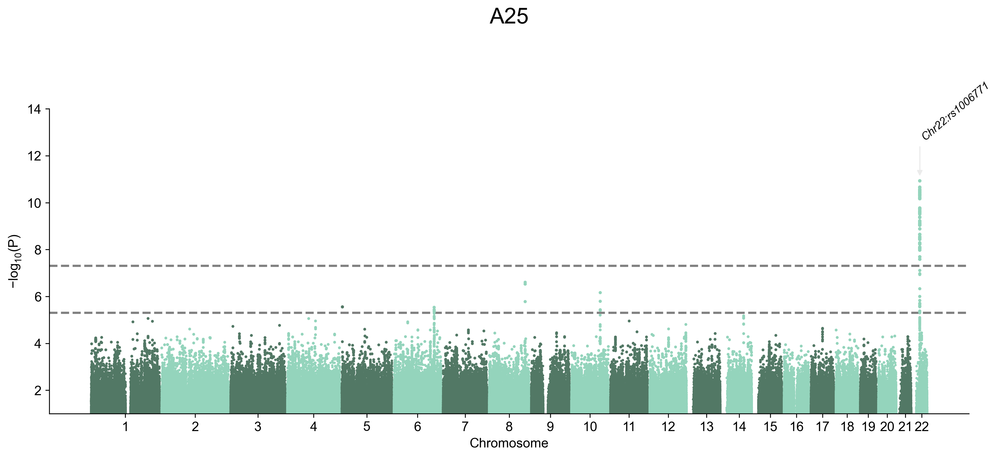

In [6]:
manhattan(A25,'A25',None,['rs1006771'],{'rs1006771':'Chr22:rs1006771'},cut=1,save=True)

## A33

In [ ]:
A33 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/3k/concat.cl12.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [10]:
sig_snps(A33)

'Chr1:rs12136529',
'Chr2:rs182801540',
'Chr3:rs11923634',
'Chr10:rs190288835',
'Chr15:rs12591859',
'Chr19:rs73070113',


2025/09/28 09:48:20 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 09:48:20 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 09:48:20 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 09:48:20 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 09:48:38  -Reading columns          : AAF,SE,Ref,Pos,Chr,Alt,N,Effect,Name,Pval
2025/09/28 09:48:38  -Renaming columns to      : EAF,SE,NEA,POS,CHR,EA,N,BETA,SNPID,P
2025/09/28 09:48:38  -Current Dataframe shape : 44984172  x  10
2025/09/28 09:48:42  -Initiating a status column: STATUS ...
2025/09/28 09:48:42  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 09:48:46  -NEAF is specified...
2025/09/28 09:48:46  -Checking if 0<= NEAF <=1 ...
2025/09/28 09:48:50  -Converted NEAF to EAF.
2025/09/28 09:48:50  -Removed 0 variants with bad NEAF.
2025/09/28 09:48:51 Start to reorder the columns...v3.6.3
2025/09/28 09

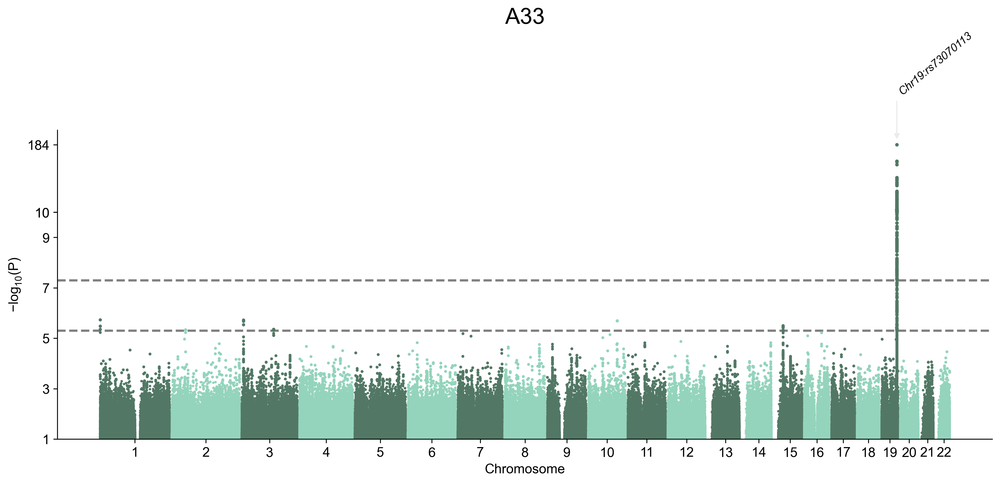

In [7]:
manhattan(A33,'A33',65,['rs73070113'],{'rs73070113':'Chr19:rs73070113'},save=True)

## B1

In [5]:
B1 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl1.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [11]:
sig_snps(B1)

'Chr1:rs6692022',
'Chr2:chr2:173764280_A_ATG',
'Chr3:rs990623',
'Chr4:rs556766153',
'Chr5:rs575304910',
'Chr6:rs116497413',
'Chr7:rs56361744',
'Chr8:rs117786293',
'Chr9:rs796944515',
'Chr10:rs2286779',
'Chr11:rs7104150',
'Chr12:rs10860165',
'Chr13:rs188535301',
'Chr14:chr14:96452325_C_CT',
'Chr15:rs113715958',
'Chr16:rs7191740',
'Chr17:rs6504260',
'Chr18:rs185922255',
'Chr19:rs34817853',
'Chr20:rs1229747547',
'Chr21:rs55904615',
'Chr22:chr22:37510301_GCTCCTT_G',


2025/09/27 21:51:45 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 21:51:45 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 21:51:45 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 21:51:45 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 21:52:05  -Reading columns          : N,Name,AAF,Pos,SE,Alt,Chr,Pval,Effect,Ref
2025/09/27 21:52:05  -Renaming columns to      : N,SNPID,EAF,POS,SE,EA,CHR,P,BETA,NEA
2025/09/27 21:52:05  -Current Dataframe shape : 45393558  x  10
2025/09/27 21:52:07  -Initiating a status column: STATUS ...
2025/09/27 21:52:07  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 21:52:12  -NEAF is specified...
2025/09/27 21:52:12  -Checking if 0<= NEAF <=1 ...
2025/09/27 21:52:14  -Converted NEAF to EAF.
2025/09/27 21:52:14  -Removed 0 variants with bad NEAF.
2025/09/27 21:52:14 Start to reorder the columns...v3.6.3
2025/09/27 21

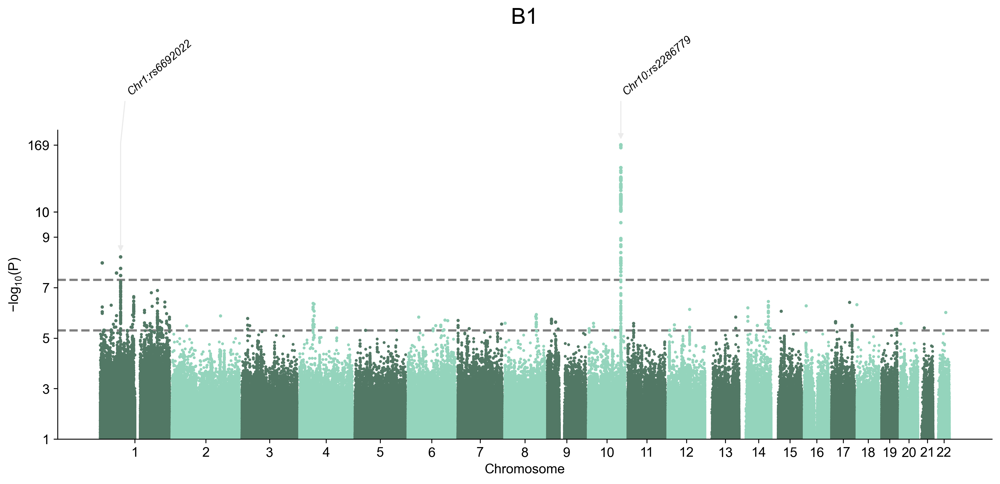

In [15]:
manhattan(B1,'B1',60,['rs6692022','rs2286779'],{'rs6692022':'Chr1:rs6692022','rs2286779':'Chr10:rs2286779'},save=True)

## B2

In [ ]:
B2 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl2.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B2)

'Chr2:rs574364844',
'Chr3:rs934673',
'Chr5:rs29767',
'Chr6:rs183178028',
'Chr7:rs186910283',
'Chr8:rs188848912',
'Chr9:rs72764834',
'Chr10:rs7910135',
'Chr11:rs116858295',
'Chr13:rs149996736',
'Chr16:rs146622556',
'Chr17:rs35802918',
'Chr19:rs144463955',
'Chr20:rs76466356',
'Chr22:rs112032147',


2025/09/27 22:31:57 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 22:31:57 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 22:31:57 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 22:31:57 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 22:32:16  -Reading columns          : Chr,Effect,Ref,Alt,Name,SE,Pval,N,AAF,Pos
2025/09/27 22:32:16  -Renaming columns to      : CHR,BETA,NEA,EA,SNPID,SE,P,N,EAF,POS
2025/09/27 22:32:16  -Current Dataframe shape : 45022647  x  10
2025/09/27 22:32:18  -Initiating a status column: STATUS ...
2025/09/27 22:32:18  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 22:32:23  -NEAF is specified...
2025/09/27 22:32:23  -Checking if 0<= NEAF <=1 ...
2025/09/27 22:32:26  -Converted NEAF to EAF.
2025/09/27 22:32:26  -Removed 0 variants with bad NEAF.
2025/09/27 22:32:26 Start to reorder the columns...v3.6.3
2025/09/27 22

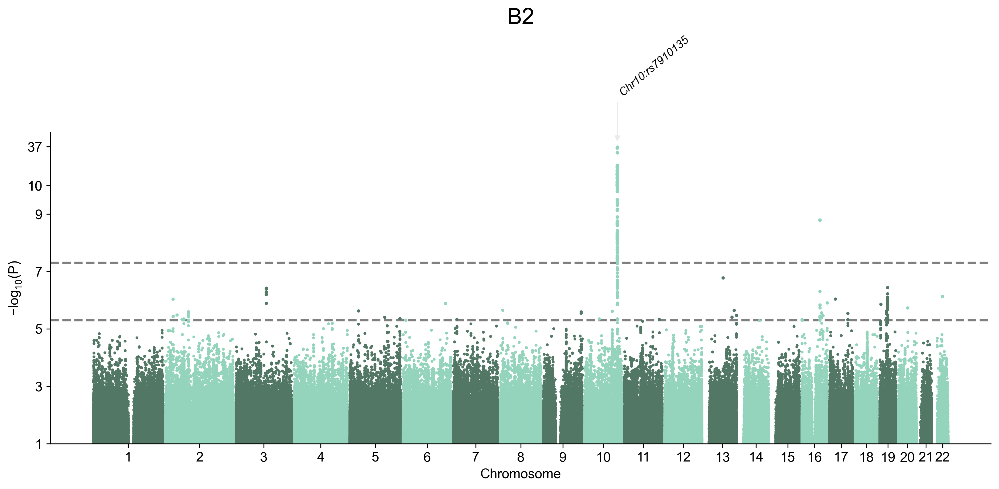

In [9]:
manhattan(B2,'B2',20,['rs7910135'],{'rs7910135':'Chr10:rs7910135'},save=True)

## B3

In [ ]:
B3 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl3.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [11]:
sig_snps(B3)

'Chr1:rs186143763',
'Chr2:rs115514503',
'Chr4:rs72732448',
'Chr6:chr6:35832248_ATATTTATTTATT_A',
'Chr8:rs2676433',
'Chr9:rs575774369',
'Chr10:rs2286779',
'Chr10:rs4751995',
'Chr10:rs4751996',
'Chr10:rs7910135',
'Chr10:rs2301179',
'Chr11:rs35240020',
'Chr13:rs79282966',
'Chr16:rs181559731',


2025/09/27 22:42:06 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 22:42:06 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 22:42:06 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 22:42:06 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 22:42:25  -Reading columns          : Chr,Effect,Ref,Alt,Name,SE,Pval,N,AAF,Pos
2025/09/27 22:42:25  -Renaming columns to      : CHR,BETA,NEA,EA,SNPID,SE,P,N,EAF,POS
2025/09/27 22:42:25  -Current Dataframe shape : 45177055  x  10
2025/09/27 22:42:29  -Initiating a status column: STATUS ...
2025/09/27 22:42:29  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 22:42:34  -NEAF is specified...
2025/09/27 22:42:34  -Checking if 0<= NEAF <=1 ...
2025/09/27 22:42:37  -Converted NEAF to EAF.
2025/09/27 22:42:37  -Removed 0 variants with bad NEAF.
2025/09/27 22:42:38 Start to reorder the columns...v3.6.3
2025/09/27 22

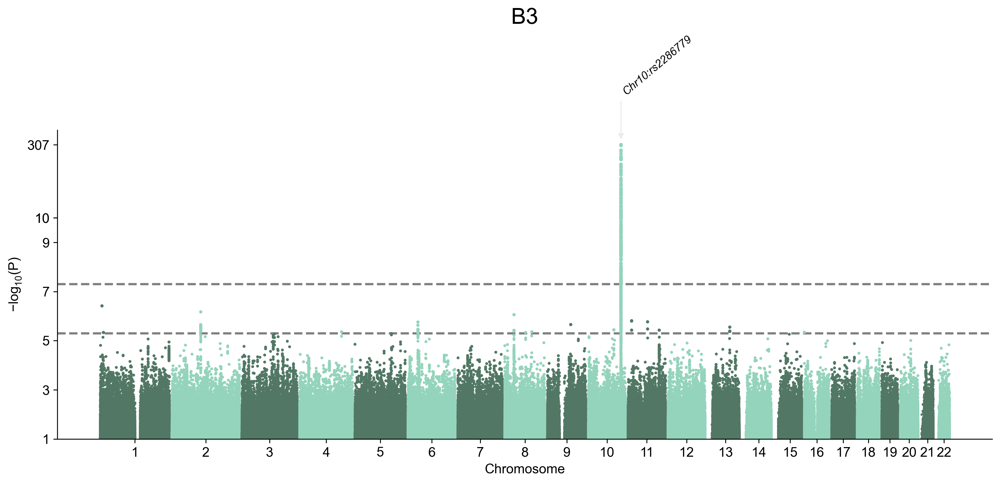

In [15]:
manhattan(B3,'B3',100,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B4

In [ ]:
B4 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B4)

'Chr1:rs12738869',
'Chr2:rs184556456',
'Chr3:rs11914379',
'Chr4:rs77174595',
'Chr5:rs569409804',
'Chr7:rs35056241',
'Chr9:rs111281340',
'Chr10:rs7910135',
'Chr11:rs897174797',
'Chr12:rs4763196',
'Chr15:rs35701313',
'Chr16:rs12928663',
'Chr18:chr18:2105081_TC_T',


2025/09/28 11:48:51 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 11:48:51 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 11:48:51 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 11:48:51 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 11:49:09  -Reading columns          : N,SE,Ref,Effect,Pval,Alt,AAF,Pos,Name,Chr
2025/09/28 11:49:09  -Renaming columns to      : N,SE,NEA,BETA,P,EA,EAF,POS,SNPID,CHR
2025/09/28 11:49:09  -Current Dataframe shape : 44931429  x  10
2025/09/28 11:49:11  -Initiating a status column: STATUS ...
2025/09/28 11:49:11  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 11:49:16  -NEAF is specified...
2025/09/28 11:49:16  -Checking if 0<= NEAF <=1 ...
2025/09/28 11:49:18  -Converted NEAF to EAF.
2025/09/28 11:49:18  -Removed 0 variants with bad NEAF.
2025/09/28 11:49:18 Start to reorder the columns...v3.6.3
2025/09/28 11

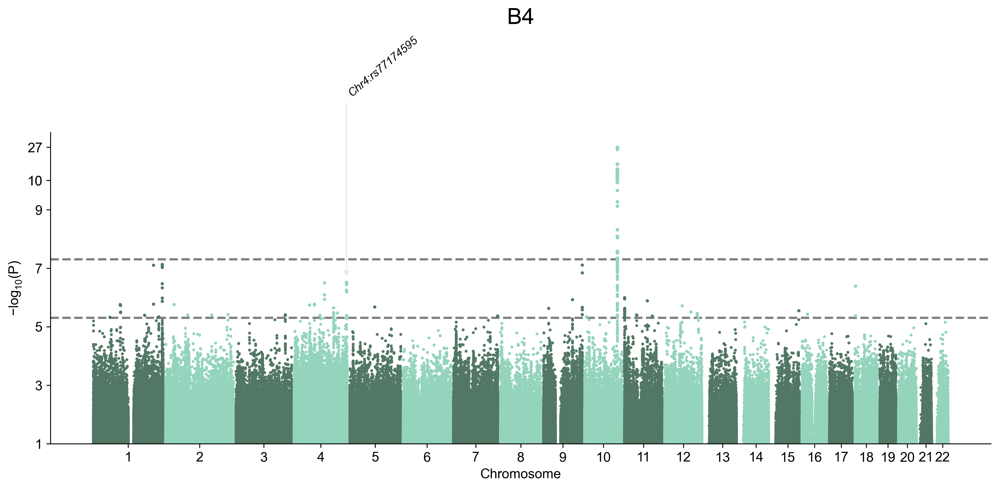

In [6]:
manhattan(B4,'B4',15,['rs77174595'],{'rs77174595':'Chr4:rs77174595'},save=True)

## B5

In [ ]:
B5 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl5.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [10]:
sig_snps(B5)

'Chr1:rs115127139',
'Chr2:rs187100951',
'Chr3:rs13093683',
'Chr4:rs566187148',
'Chr5:rs9327638',
'Chr6:rs80019112',
'Chr7:rs535741939',
'Chr8:rs191865688',
'Chr9:rs692502',
'Chr10:rs2286779',
'Chr11:rs2034326',
'Chr12:rs1573991',
'Chr15:rs72747737',
'Chr16:rs533987953',
'Chr17:rs9906711',
'Chr18:rs111641747',
'Chr20:rs775925087',
'Chr21:chr21:41777714_T_TCACACACA',


2025/09/28 10:14:10 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 10:14:10 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 10:14:10 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 10:14:10 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 10:14:28  -Reading columns          : AAF,SE,Ref,Pos,Chr,Alt,N,Effect,Name,Pval
2025/09/28 10:14:28  -Renaming columns to      : EAF,SE,NEA,POS,CHR,EA,N,BETA,SNPID,P
2025/09/28 10:14:28  -Current Dataframe shape : 45068422  x  10
2025/09/28 10:14:31  -Initiating a status column: STATUS ...
2025/09/28 10:14:31  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 10:14:35  -NEAF is specified...
2025/09/28 10:14:35  -Checking if 0<= NEAF <=1 ...
2025/09/28 10:14:38  -Converted NEAF to EAF.
2025/09/28 10:14:38  -Removed 0 variants with bad NEAF.
2025/09/28 10:14:39 Start to reorder the columns...v3.6.3
2025/09/28 10

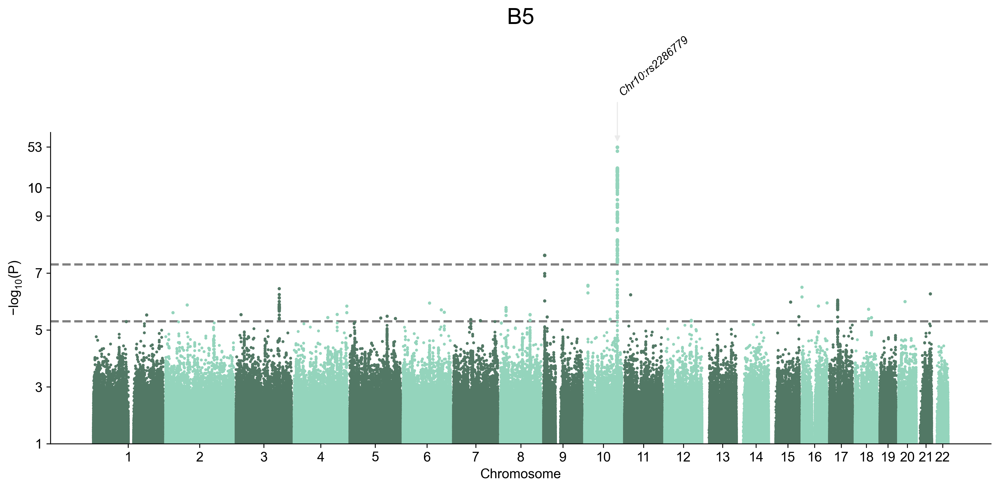

In [13]:
manhattan(B5,'B5',30,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B6

In [ ]:
B6 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl6.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [10]:
sig_snps(B6)

'Chr1:rs524338',
'Chr4:rs189840083',
'Chr6:rs142610046',
'Chr8:rs990712',
'Chr9:rs562319908',
'Chr9:rs529494798',
'Chr10:rs2286779',
'Chr13:rs549045098',
'Chr18:rs188233623',
'Chr19:rs1241462',


2025/09/28 15:23:24 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 15:23:24 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 15:23:24 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 15:23:24 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 15:23:43  -Reading columns          : N,SE,Ref,Effect,Pval,Alt,AAF,Pos,Name,Chr
2025/09/28 15:23:43  -Renaming columns to      : N,SE,NEA,BETA,P,EA,EAF,POS,SNPID,CHR
2025/09/28 15:23:43  -Current Dataframe shape : 44937898  x  10
2025/09/28 15:23:46  -Initiating a status column: STATUS ...
2025/09/28 15:23:46  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 15:23:50  -NEAF is specified...
2025/09/28 15:23:50  -Checking if 0<= NEAF <=1 ...
2025/09/28 15:23:53  -Converted NEAF to EAF.
2025/09/28 15:23:53  -Removed 0 variants with bad NEAF.
2025/09/28 15:23:53 Start to reorder the columns...v3.6.3
2025/09/28 15

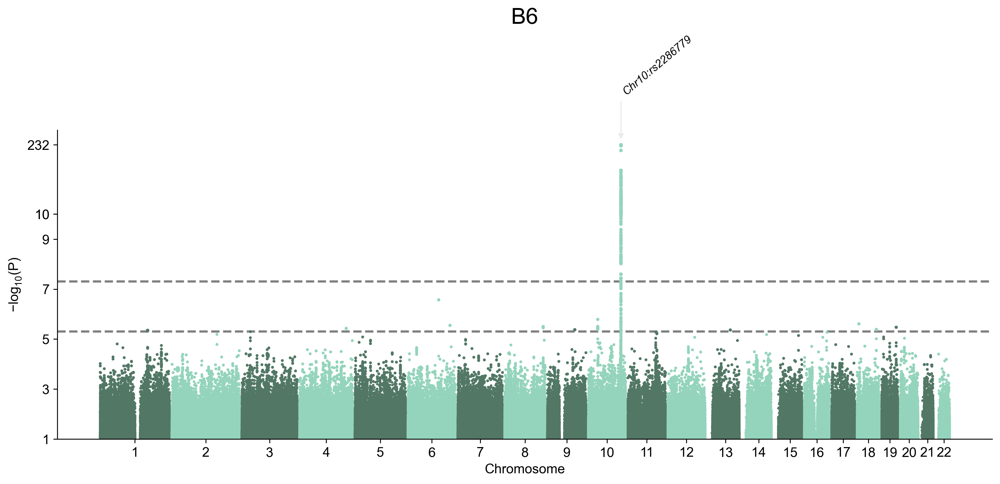

In [13]:
manhattan(B6,'B6',80,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B7

In [ ]:
B7 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl7.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B7)

'Chr1:rs77323299',
'Chr2:rs12472064',
'Chr3:rs4685813',
'Chr4:rs58107016',
'Chr5:rs550799569',
'Chr6:rs28895061',
'Chr7:rs11983880',
'Chr8:rs13266153',
'Chr9:rs78469198',
'Chr10:rs11255507',
'Chr11:rs138471670',
'Chr12:chr12:92995012_TG_T',
'Chr13:rs111849827',
'Chr14:rs146564991',
'Chr15:rs79797279',
'Chr17:rs149748996',
'Chr18:rs200682670',


2025/09/28 16:08:30 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 16:08:30 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 16:08:30 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 16:08:30 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 16:08:48  -Reading columns          : Effect,Pval,Alt,Ref,AAF,Name,Pos,SE,N,Chr
2025/09/28 16:08:48  -Renaming columns to      : BETA,P,EA,NEA,EAF,SNPID,POS,SE,N,CHR
2025/09/28 16:08:48  -Current Dataframe shape : 44549789  x  10
2025/09/28 16:08:51  -Initiating a status column: STATUS ...
2025/09/28 16:08:51  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 16:08:56  -NEAF is specified...
2025/09/28 16:08:56  -Checking if 0<= NEAF <=1 ...
2025/09/28 16:08:59  -Converted NEAF to EAF.
2025/09/28 16:08:59  -Removed 0 variants with bad NEAF.
2025/09/28 16:09:00 Start to reorder the columns...v3.6.3
2025/09/28 16

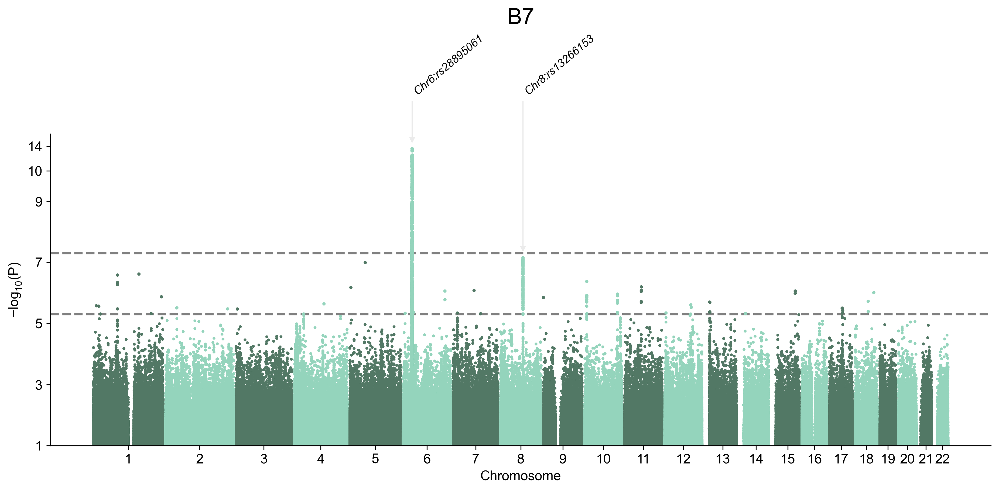

In [9]:
manhattan(B7,'B7',5,['rs28895061','rs13266153'],{'rs28895061':'Chr6:rs28895061','rs13266153':'Chr8:rs13266153'},save=True)

## B8

In [ ]:
B8 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl8.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [11]:
sig_snps(B8)

'Chr1:rs34364548',
'Chr2:rs529321310',
'Chr6:rs34967069',
'Chr7:rs73156303',
'Chr10:rs2286779',
'Chr11:rs17415437',
'Chr14:chr14:29358386_T_TG',
'Chr18:rs9946908',
'Chr19:rs117758012',
'Chr20:rs182562326',
'Chr22:rs192363839',


2025/09/28 16:42:17 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 16:42:17 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 16:42:17 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 16:42:17 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 16:42:37  -Reading columns          : Effect,Pval,Alt,Ref,AAF,Name,Pos,SE,N,Chr
2025/09/28 16:42:37  -Renaming columns to      : BETA,P,EA,NEA,EAF,SNPID,POS,SE,N,CHR
2025/09/28 16:42:37  -Current Dataframe shape : 44374276  x  10
2025/09/28 16:42:40  -Initiating a status column: STATUS ...
2025/09/28 16:42:40  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 16:42:45  -NEAF is specified...
2025/09/28 16:42:45  -Checking if 0<= NEAF <=1 ...
2025/09/28 16:42:47  -Converted NEAF to EAF.
2025/09/28 16:42:47  -Removed 0 variants with bad NEAF.
2025/09/28 16:42:48 Start to reorder the columns...v3.6.3
2025/09/28 16

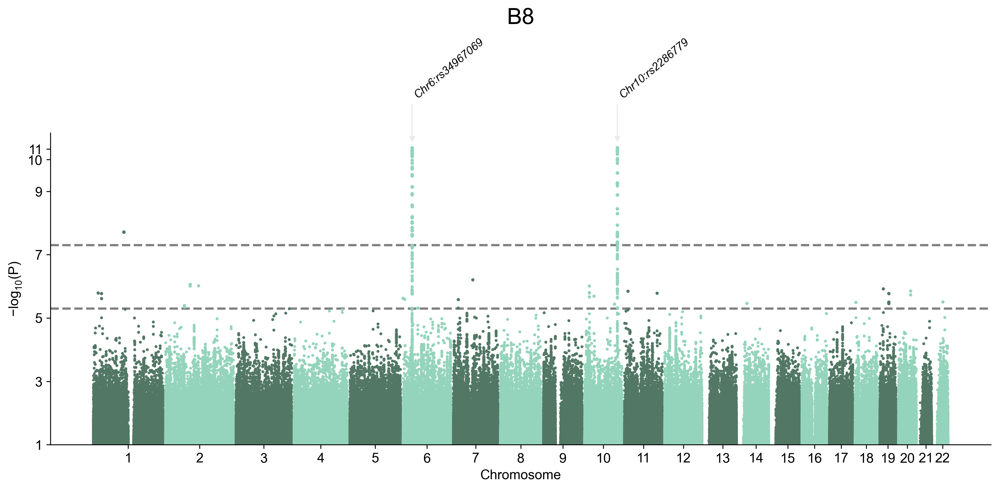

In [15]:
manhattan(B8,'B8',3,['rs34967069','rs2286779'],{'rs34967069':'Chr6:rs34967069','rs2286779':'Chr10:rs2286779'},save=True)

## B14

In [ ]:
B14 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl14.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [8]:
sig_snps(B14)

'Chr3:rs565188504',
'Chr8:rs67654120',
'Chr9:rs138185836',
'Chr10:rs7910135',
'Chr15:rs143951831',
'Chr16:rs755708425',
'Chr17:rs77562336',
'Chr19:rs878609',


2025/09/28 17:35:41 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 17:35:41 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 17:35:41 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 17:35:41 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 17:35:59  -Reading columns          : AAF,N,Chr,Effect,Pos,Alt,SE,Pval,Ref,Name
2025/09/28 17:35:59  -Renaming columns to      : EAF,N,CHR,BETA,POS,EA,SE,P,NEA,SNPID
2025/09/28 17:35:59  -Current Dataframe shape : 44726434  x  10
2025/09/28 17:36:02  -Initiating a status column: STATUS ...
2025/09/28 17:36:02  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 17:36:06  -NEAF is specified...
2025/09/28 17:36:06  -Checking if 0<= NEAF <=1 ...
2025/09/28 17:36:09  -Converted NEAF to EAF.
2025/09/28 17:36:09  -Removed 0 variants with bad NEAF.
2025/09/28 17:36:10 Start to reorder the columns...v3.6.3
2025/09/28 17

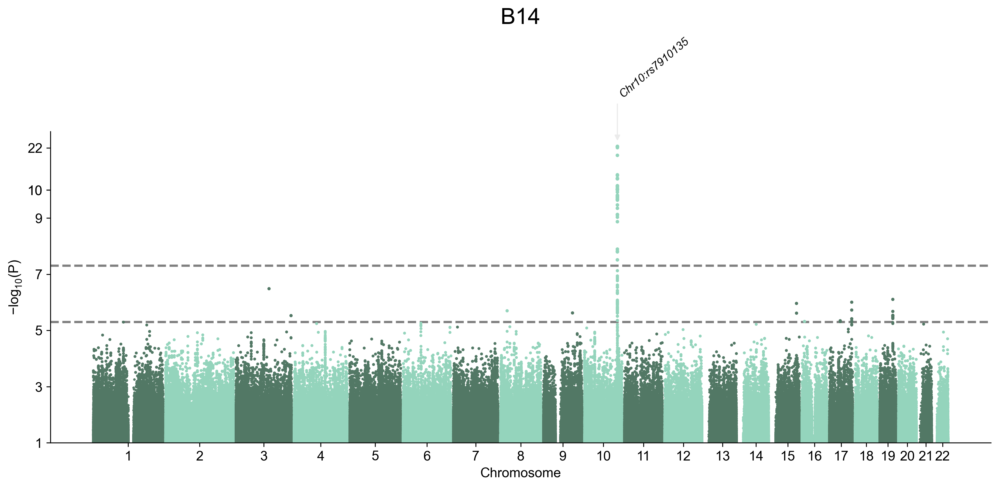

In [11]:
manhattan(B14,'B14',8,['rs7910135'],{'rs7910135':'Chr10:rs7910135'},save=True)

## B15

In [ ]:
B15 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl15.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [13]:
sig_snps(B15)

'Chr1:rs6662409',
'Chr3:rs542658880',
'Chr4:rs142483795',
'Chr5:rs773652739',
'Chr6:rs74813177',
'Chr9:rs140331624',
'Chr10:rs2286779',
'Chr11:rs544189165',
'Chr12:rs202131669',
'Chr13:rs117125150',
'Chr14:rs200978509',
'Chr15:rs8032228',
'Chr20:rs6109694',
'Chr21:rs62210285',


2025/09/28 18:24:32 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 18:24:32 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 18:24:32 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 18:24:32 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 18:24:51  -Reading columns          : AAF,N,Chr,Effect,Pos,Alt,SE,Pval,Ref,Name
2025/09/28 18:24:51  -Renaming columns to      : EAF,N,CHR,BETA,POS,EA,SE,P,NEA,SNPID
2025/09/28 18:24:51  -Current Dataframe shape : 44827237  x  10
2025/09/28 18:24:53  -Initiating a status column: STATUS ...
2025/09/28 18:24:53  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 18:24:58  -NEAF is specified...
2025/09/28 18:24:58  -Checking if 0<= NEAF <=1 ...
2025/09/28 18:24:59  -Converted NEAF to EAF.
2025/09/28 18:24:59  -Removed 0 variants with bad NEAF.
2025/09/28 18:25:00 Start to reorder the columns...v3.6.3
2025/09/28 18

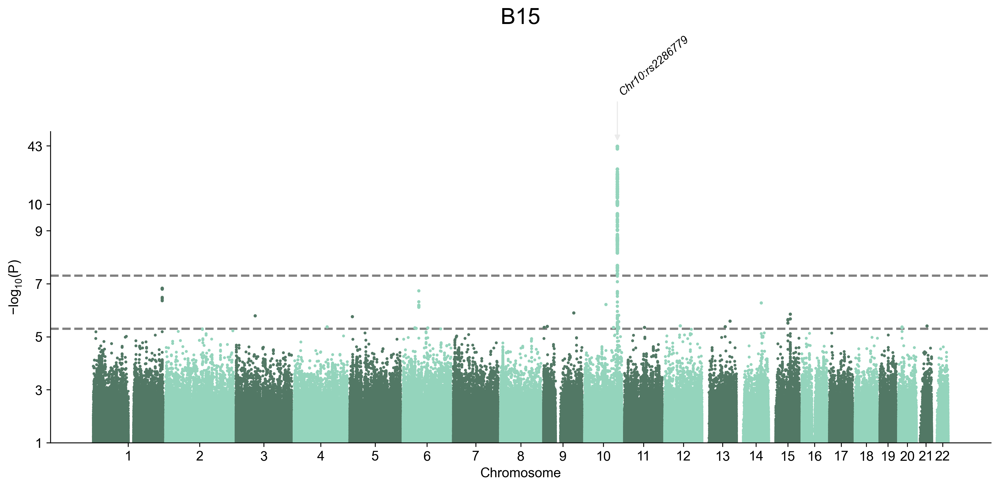

In [17]:
manhattan(B15,'B15',15,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B16

In [ ]:
B16 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl16.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B16)

'Chr1:rs35184161',
'Chr2:rs10629611',
'Chr3:rs78823700',
'Chr4:rs116492037',
'Chr5:rs191453',
'Chr8:rs75576842',
'Chr9:rs539913121',
'Chr10:rs4751995',
'Chr11:rs78690751',
'Chr12:rs7313211',
'Chr13:rs1157207',
'Chr14:rs77497875',
'Chr15:rs188415743',
'Chr16:rs144562676',
'Chr18:rs143038106',
'Chr20:rs6081869',
'Chr22:rs78991320',


2025/09/28 23:24:37 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 23:24:37 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 23:24:37 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 23:24:37 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 23:24:55  -Reading columns          : SE,Ref,Alt,Pos,N,Name,Pval,AAF,Chr,Effect
2025/09/28 23:24:55  -Renaming columns to      : SE,NEA,EA,POS,N,SNPID,P,EAF,CHR,BETA
2025/09/28 23:24:55  -Current Dataframe shape : 44821971  x  10
2025/09/28 23:24:57  -Initiating a status column: STATUS ...
2025/09/28 23:24:57  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 23:25:01  -NEAF is specified...
2025/09/28 23:25:01  -Checking if 0<= NEAF <=1 ...
2025/09/28 23:25:03  -Converted NEAF to EAF.
2025/09/28 23:25:03  -Removed 0 variants with bad NEAF.
2025/09/28 23:25:03 Start to reorder the columns...v3.6.3
2025/09/28 23

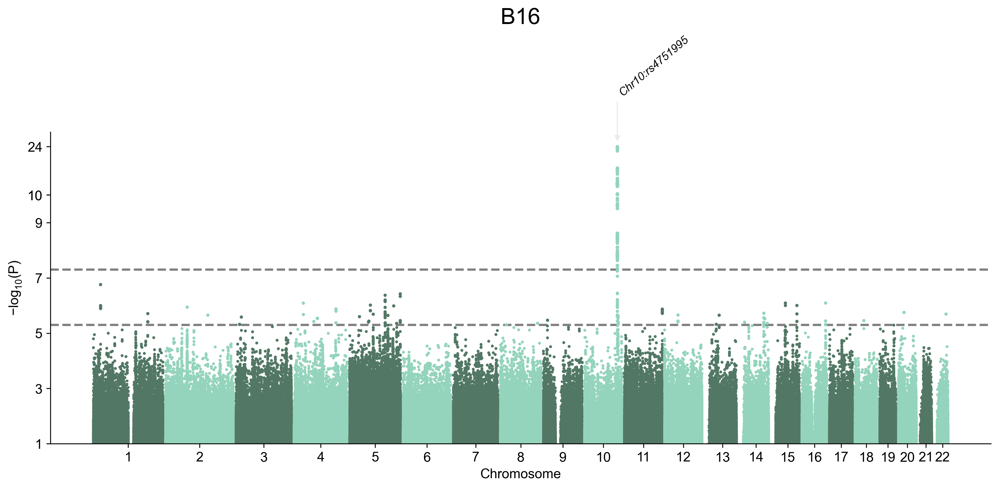

In [9]:
manhattan(B16,'B16',8,['rs4751995'],{'rs4751995':'Chr10:rs4751995'},save=True)

## B17

In [ ]:
B17 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl17.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [11]:
sig_snps(B17)

'Chr1:rs71152349',
'Chr7:rs2906311',
'Chr8:rs28991894',
'Chr9:rs181589984',
'Chr10:rs2286779',
'Chr11:rs180918588',
'Chr12:rs193264651',
'Chr14:rs143690204',
'Chr15:rs117488884',
'Chr18:rs7242402',
'Chr19:rs117349207',
'Chr20:chr20:8089012_C_CTCT',
'Chr21:rs180936402',


2025/09/28 23:32:54 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 23:32:54 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 23:32:54 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 23:32:54 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 23:33:12  -Reading columns          : SE,Ref,Alt,Pos,N,Name,Pval,AAF,Chr,Effect
2025/09/28 23:33:12  -Renaming columns to      : SE,NEA,EA,POS,N,SNPID,P,EAF,CHR,BETA
2025/09/28 23:33:12  -Current Dataframe shape : 44765051  x  10
2025/09/28 23:33:14  -Initiating a status column: STATUS ...
2025/09/28 23:33:14  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 23:33:19  -NEAF is specified...
2025/09/28 23:33:19  -Checking if 0<= NEAF <=1 ...
2025/09/28 23:33:21  -Converted NEAF to EAF.
2025/09/28 23:33:21  -Removed 0 variants with bad NEAF.
2025/09/28 23:33:21 Start to reorder the columns...v3.6.3
2025/09/28 23

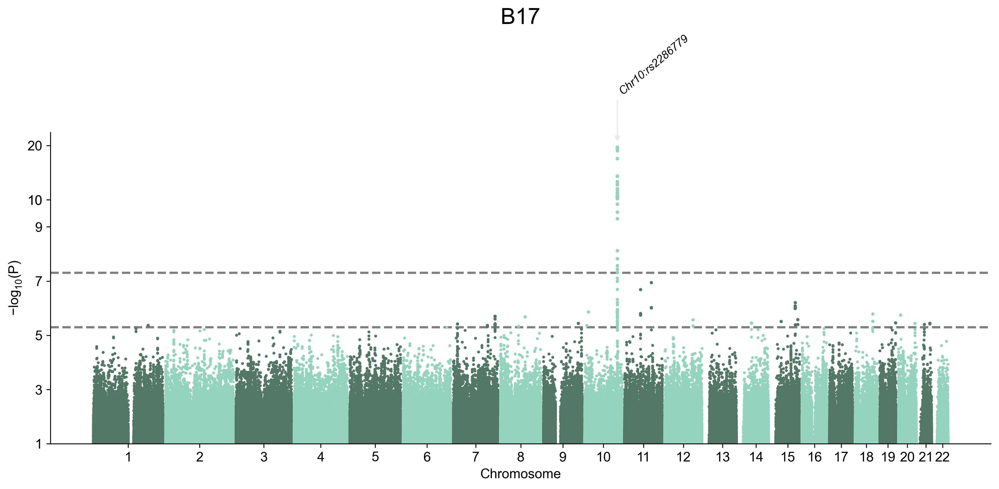

In [15]:
manhattan(B17,'B17',5,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B18

In [ ]:
B18 = pd.read_csv('/Users/Evelyn/Documents/UKB/materials/manhattan/leiden/concat.cl18.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B18)

'Chr1:rs147550966',
'Chr2:rs62141903',
'Chr3:rs146037597',
'Chr4:rs17019737',
'Chr6:rs577399252',
'Chr8:rs78798639',
'Chr9:rs944606',
'Chr10:rs4751995',
'Chr11:rs138513426',
'Chr12:rs75047192',
'Chr13:rs550336453',
'Chr14:rs544551428',
'Chr15:rs201773890',
'Chr18:rs191550689',
'Chr19:rs62126286',
'Chr20:rs758882651',
'Chr22:rs11456612',


2025/09/28 23:43:31 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/28 23:43:31 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/28 23:43:31 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/28 23:43:31 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/28 23:43:48  -Reading columns          : SE,Chr,AAF,Pos,N,Name,Effect,Pval,Ref,Alt
2025/09/28 23:43:48  -Renaming columns to      : SE,CHR,EAF,POS,N,SNPID,BETA,P,NEA,EA
2025/09/28 23:43:48  -Current Dataframe shape : 45145887  x  10
2025/09/28 23:43:50  -Initiating a status column: STATUS ...
2025/09/28 23:43:50  -Genomic coordinates are based on GRCh37/hg19...
2025/09/28 23:43:54  -NEAF is specified...
2025/09/28 23:43:54  -Checking if 0<= NEAF <=1 ...
2025/09/28 23:43:56  -Converted NEAF to EAF.
2025/09/28 23:43:56  -Removed 0 variants with bad NEAF.
2025/09/28 23:43:56 Start to reorder the columns...v3.6.3
2025/09/28 23

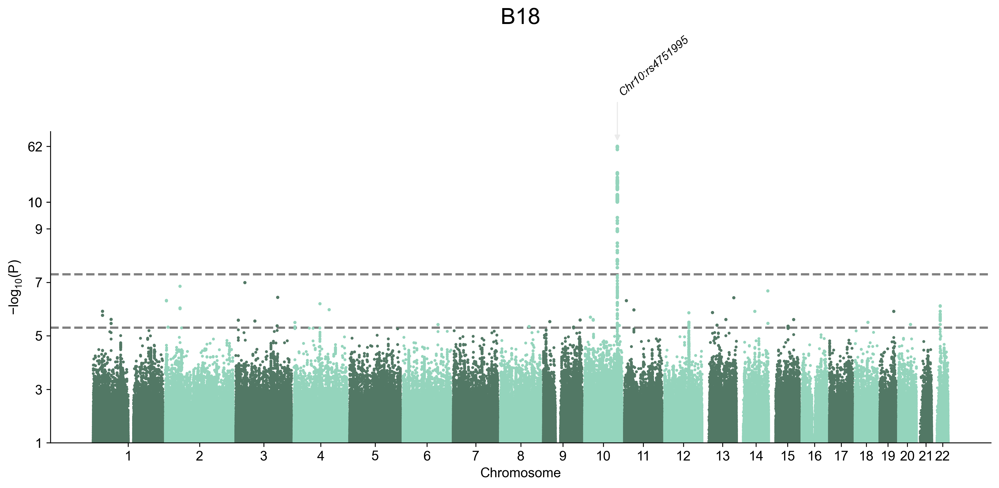

In [9]:
manhattan(B18,'B18',25,['rs4751995'],{'rs4751995':'Chr10:rs4751995'},save=True)